In [2]:
import pandas as pd
import numpy as np
from itertools import combinations
from collections import Counter
from tqdm import tqdm
from scipy.optimize import linear_sum_assignment
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA

def get_eigenbasis(X, k):
    Xc = X - X.mean(axis=0)
    pca = PCA(n_components=k)
    pca.fit(Xc)
    eigvecs = pca.components_.T   # shape: (d, k)
    eigvals = pca.explained_variance_
    return eigvecs, eigvals

def riswie_axis_matching(X, Y, k):
    # Get projections
    Xc = X - X.mean(axis=0)
    Yc = Y - Y.mean(axis=0)
    eigvecs_X, _ = get_eigenbasis(Xc, k)
    eigvecs_Y, _ = get_eigenbasis(Yc, k)
    AX = Xc @ eigvecs_X  # shape (n, k)
    BY = Yc @ eigvecs_Y  # shape (n, k)
    # Build cost matrix and sign matrix
    C = np.zeros((k, k))
    signs = np.zeros((k, k), dtype=int)
    for i in range(k):
        a_sorted = np.sort(AX[:, i])
        for j in range(k):
            b = BY[:, j]
            b_pos_sorted = np.sort(b)
            b_neg_sorted = np.sort(-b)
            # compare distributions
            #d_pos = np.mean(np.abs(a_sorted - b_pos_sorted))
            #d_neg = np.mean(np.abs(a_sorted - b_neg_sorted))
            # uniform weights for empirical measures
            a_weights = np.ones(len(a_sorted)) / len(a_sorted)
            b_weights = np.ones(len(b)) / len(b)
            # Use W2^2 for positive and negative sign
            d_pos = ot.lp.emd2_1d(a_sorted, b_pos_sorted, a_weights, b_weights)
            d_neg = ot.lp.emd2_1d(a_sorted, b_neg_sorted, a_weights, b_weights)
            if d_pos <= d_neg:
                C[i, j] = d_pos
                signs[i, j] = +1
            else:
                C[i, j] = d_neg
                signs[i, j] = -1
    row_ind, col_ind = linear_sum_assignment(C)
    # For each matched pair, get the sign
    best_signs = [signs[i, j] for i, j in zip(row_ind, col_ind)]
    return row_ind, col_ind, best_signs, eigvecs_X, eigvecs_Y

def compute_alignment_rotation(X, Y, k):
    row_ind, col_ind, best_signs, eigvecs_X, eigvecs_Y = riswie_axis_matching(X, Y, k)
    # Reorder and apply signs
    X_basis = eigvecs_X[:, row_ind]                  # (d, k)
    Y_basis = eigvecs_Y[:, col_ind] * best_signs     # (d, k)
    # Complete to d dimensions if needed (for general d, or use k x k only)
    # Compute R that maps X_basis to Y_basis: R @ X_basis = Y_basis → R = Y_basis @ X_basis.T
    # If X_basis is orthogonal, this works.
    #R = Y_basis @ np.linalg.inv(X_basis)
    # In practice, both are orthogonal, so X_basis.T = X_basis^-1
    R = Y_basis @ X_basis.T
    return R

def boosted_ot(X, Y, k=2):
    R = compute_alignment_rotation(X, Y, k)
    Xc = X - X.mean(axis=0)
    Yc = Y - Y.mean(axis=0)
    Yc_aligned = Yc @ R    
    return standard_ot(Xc, Yc_aligned)

def boosted_sw(X, Y, k=2, n_proj=25):
    R = compute_alignment_rotation(X, Y, k)
    Xc = X - X.mean(axis=0)
    Yc = Y - Y.mean(axis=0)
    Yc_aligned = Yc @ R    
    return sliced_wasserstein(Xc, Yc_aligned, n_proj=n_proj)



In [12]:
import os
import numpy as np
from plyfile import PlyData
from scipy.optimize import linear_sum_assignment
from scipy.stats import wasserstein_distance
from sklearn.decomposition import PCA
from tqdm import tqdm
import plotly.graph_objects as go

# ==== DATA LOADING ====
# Change to your FAUST registrations folder
data_root = "MPI-FAUST/training/registrations"
file_template = "tr_reg_{:03d}.ply"

# 10 people × 10 poses = 100 meshes
N_PEOPLE = 10
N_POSES = 10

mesh_paths = [os.path.join(data_root, file_template.format(p*10 + s))
              for p in range(N_PEOPLE) for s in range(N_POSES)]

assert all(os.path.exists(p) for p in mesh_paths), "Some FAUST ply files missing!"

# ==== LOAD ALL MESHES ====
def load_mesh(ply_path):
    ply = PlyData.read(ply_path)
    verts = np.vstack([ply['vertex'][c] for c in ('x', 'y', 'z')]).T
    faces = np.vstack(ply['face']['vertex_indices'])
    return verts, faces

verts_list, faces_list = [], []
for path in tqdm(mesh_paths, desc="Loading meshes"):
    V, F = load_mesh(path)
    verts_list.append(V)
    faces_list.append(F)
verts_array = np.stack(verts_list, axis=0)  # shape: (100, N_VERTS, 3)
faces = faces_list[0]  # all have same topology

# ==== RISWIE BASIS & DISTANCE ====
# def riswie_basis(X):
#     Xc = X - X.mean(0)
#     cov = np.cov(Xc.T)
#     vals, vecs = np.linalg.eigh(cov)
#     idx = np.argsort(vals)[::-1]
#     lambdas = vals[idx]
#     vecs = vecs[:, idx]
#     return np.sqrt(lambdas), vecs

# def riswie_distance(X, Y):
#     # Both are (N, 3)
#     Xc, Yc = X - X.mean(0), Y - Y.mean(0)
#     _, B_X = riswie_basis(X)
#     _, B_Y = riswie_basis(Y)
#     proj_X, proj_Y = Xc @ B_X, Yc @ B_Y

#     d = 3
#     C = np.zeros((d, d))
#     signs = np.zeros((d, d))
#     for i in range(d):
#         for j in range(d):
#             w_pos = wasserstein_distance(proj_X[:, i], proj_Y[:, j])
#             w_neg = wasserstein_distance(proj_X[:, i], -proj_Y[:, j])
#             if w_pos < w_neg:
#                 C[i, j] = w_pos
#                 signs[i, j] = +1
#             else:
#                 C[i, j] = w_neg
#                 signs[i, j] = -1
#     row_ind, col_ind = linear_sum_assignment(C)
#     align_cost = C[row_ind, col_ind].mean()
#     return align_cost


def pca_embedding(X, k=None):
    Xc = X - X.mean(axis=0)
    pca = PCA(n_components=k if k else X.shape[1])
    pca.fit(Xc)
    return pca.transform(Xc)  # returns n x k array, like diffusion_embedding

def pca_embedding_with_eigvals_and_evecs(X, k=None):
    Xc = X - X.mean(axis=0)
    k = k if k else X.shape[1]
    pca = PCA(n_components=k)
    pca.fit(Xc)
    AX = pca.transform(Xc)
    eigvals = pca.explained_variance_
    evecs = pca.components_.T  # d x k
    return AX, eigvals, evecs

# think more about t and symmetric normalization
def diffusion_embedding(X, k=5, epsilon=None, t=1):
    Xc = X - X.mean(axis=0)
    n = Xc.shape[0]
    D_sq = cdist(Xc, Xc, 'sqeuclidean')
    if epsilon is None:
        epsilon = np.median(D_sq)
    K = np.exp(-D_sq / epsilon)
    d = np.sum(K, axis=1)
    D_inv_sqrt = np.diag(1.0 / np.sqrt(d))
    P_tilde = D_inv_sqrt @ K @ D_inv_sqrt

    # --- Choose eigensolver automatically ---
    # Full eigendecomposition if k >= n-1
    if k >= n - 1:
        vals, vecs = eigh(P_tilde)
        order = np.argsort(vals)[::-1]
        vals = vals[order]
        vecs = vecs[:, order]
        # Remove the trivial eigenvector (usually the top one)
        lambdas = vals[1:k+1]
        phis = vecs[:, 1:k+1]
    else:
        # Partial: only top k+1
        vals, vecs = eigsh(P_tilde, k=k+1, which='LM')
        order = np.argsort(vals)[::-1]
        vals = vals[order]
        vecs = vecs[:, order]
        lambdas = vals[1:k+1]
        phis = vecs[:, 1:k+1]

    embedding_matrix = phis * (lambdas ** t)
    return embedding_matrix


###################################
# Sliced Wasserstein Assignment   #
###################################

def get_sorted_columns(A):
    # A: n x k array
    # Returns: list of length k, each is sorted 1D array of size n
    return [np.sort(A[:, i]) for i in range(A.shape[1])]

from ot.lp import emd_1d_sorted

def emd2_1d_nosort(x_sorted, y_sorted, a_sorted=None, b_sorted=None,
                   metric="sqeuclidean", p=2.0):
    """
    1D W2 cost between two **already‐sorted** arrays.
    x_sorted, y_sorted: float arrays, ascending.
    a_sorted, b_sorted: their weights (default uniform).
    Runs in O(n + m) time.
    Returns W2^2 (not √).
    """
    n, m = len(x_sorted), len(y_sorted)
    if a_sorted is None:
        a_sorted = np.ones(n, dtype=float)/n
    if b_sorted is None:
        b_sorted = np.ones(m, dtype=float)/m

    # POT’s core routine: no more sorting!
    Gs, indices, cost = emd_1d_sorted(
        a_sorted.astype(np.float64),
        b_sorted.astype(np.float64),
        x_sorted.astype(np.float64),
        y_sorted.astype(np.float64),
        metric=metric, p=p
    )
    return cost

# write more general 1D Wasserstein distance
def compute_1d_wasserstein_sorted(u_sorted, v_sorted): # we don't need to pass in sorted arrays, we can change this later
    n, m = len(u_sorted), len(v_sorted)
    # Fastest: Closed form if n == m (uniform weights)
    if n == m:
        return np.mean((u_sorted - v_sorted) ** 2)
    else:
        a = np.ones(n) / n
        b = np.ones(m) / m
        return emd2_1d_nosort(u_sorted, v_sorted, a, b, metric="sqeuclidean", p=2.0)
    #return (ot.lp.emd2_1d(u_sorted, v_sorted, a, b)) # W2^2

def assignment_sliced_wasserstein(X, Y, AX, BY, eigvals_X=None, eigvals_Y=None, eigvecs_X=None, eigvecs_Y=None, print_pairings=False):
    k = AX.shape[1]
    # Precompute and cache sorted columns
    AX_sorted = get_sorted_columns(AX)
    BY_sorted = get_sorted_columns(BY)
    C = np.zeros((k, k))
    for i in range(k):
        a_sorted = AX_sorted[i]
        for j in range(k):
            b_sorted = BY_sorted[j]
            # positive‐sign cost (both arrays already ascending)
            d_pos = compute_1d_wasserstein_sorted(a_sorted, b_sorted)
            # negative‐sign cost: reverse the sorted array before negating
            b_neg_sorted = -b_sorted[::-1]
            d_neg = compute_1d_wasserstein_sorted(a_sorted, b_neg_sorted)
            C[i, j] = min(d_pos, d_neg)
    row_ind, col_ind = linear_sum_assignment(C)
    total_cost = C[row_ind, col_ind].sum()

    if print_pairings and eigvals_X is not None and eigvecs_X is not None and eigvals_Y is not None and eigvecs_Y is not None:
        print("\nRISWIE Axis Pairings:")
        for idx in range(len(row_ind)):
            i, j = row_ind[idx], col_ind[idx]
            print(f"X axis {i}: eval={eigvals_X[i]:.3g}, evec={eigvecs_X[:,i]}   <--->   "
                  f"Y axis {j}: eval={eigvals_Y[j]:.3g}, evec={eigvecs_Y[:,j]}, "
                  f"contribution={C[i, j]:.6f}")
    return np.sqrt((1 / k) * total_cost)
 # to hopefully be a pseudometric - regardless, matching units



from sklearn.manifold import SpectralEmbedding

def spectral_embedding(X, k=None):
    Xc = X - X.mean(axis=0)
    n = Xc.shape[0]
    k = k if k is not None else min(n - 1, Xc.shape[1])
    se = SpectralEmbedding(n_components=k, affinity='rbf')
    #se = SpectralEmbedding(n_components=k, affinity='nearest_neighbors', n_neighbors=min(10, n-1))
    return se.fit_transform(Xc)


def pca_embedding_with_eigvals_and_evecs(X, k=None):
    Xc = X - X.mean(axis=0)
    k = k if k else X.shape[1]
    pca = PCA(n_components=k)
    pca.fit(Xc)
    AX = pca.transform(Xc)
    eigvals = pca.explained_variance_
    evecs = pca.components_.T  # d x k
    return AX, eigvals, evecs

def assignment_weighted_after(X, Y, AX, BY, eigvals_X, eigvals_Y, eigvecs_X=None, eigvecs_Y=None, weight_type='geometric', print_pairings=False):
    k = AX.shape[1]
    # Do NOT normalize eigenvalues beforehand
    AX_sorted = get_sorted_columns(AX)
    BY_sorted = get_sorted_columns(BY)
    C = np.zeros((k, k))
    for i in range(k):
        a_sorted = AX_sorted[i]
        for j in range(k):
            b_sorted = BY_sorted[j]
            d_pos = compute_1d_wasserstein_sorted(a_sorted, b_sorted)
            b_neg_sorted = -b_sorted[::-1]
            d_neg = compute_1d_wasserstein_sorted(a_sorted, b_neg_sorted)
            C[i, j] = min(d_pos, d_neg)
    row_ind, col_ind = linear_sum_assignment(C)
    costs = C[row_ind, col_ind]
    # Compute geometric mean weights for assigned pairs (using raw eigvals)
    if weight_type == 'geometric':
        weights = np.sqrt(eigvals_X[row_ind] * eigvals_Y[col_ind])
    elif weight_type == 'arithmetic':
        weights = 0.5 * (eigvals_X[row_ind] + eigvals_Y[col_ind])
    else:
        raise ValueError("weight_type must be 'geometric' or 'arithmetic'")
    weights_sum = weights.sum()
    # Normalize weights to sum to 1
    weights = weights / weights_sum if weights_sum > 0 else np.ones_like(weights)/k
    total_cost = (weights * costs).sum()
    if print_pairings and eigvals_X is not None and eigvecs_X is not None and eigvals_Y is not None and eigvecs_Y is not None:
            print("\nRISWIE-J (Weighted-After) Axis Pairings:")
            for idx in range(len(row_ind)):
                i, j = row_ind[idx], col_ind[idx]
                cost = costs[idx]
                weight = weights[idx]
                contribution = weight * cost
                print(f"X axis {i}: eval={eigvals_X[i]:.3g}, evec={eigvecs_X[:,i]}   <--->   "
                    f"Y axis {j}: eval={eigvals_Y[j]:.3g}, evec={eigvecs_Y[:,j]}")
                print(f"    W2={cost:.6f} | weight={weight:.6f} | weighted contribution={contribution:.6f}")
    return np.sqrt(total_cost)

# ==== DISTANCE MATRIX ====
N = N_PEOPLE * N_POSES
D = np.zeros((N, N))
for i in tqdm(range(N), desc="RISWIE distance matrix"):
    for j in range(i+1, N):
        # Xi, eigvals_Xi, eigvecs_Xi = pca_embedding_with_eigvals_and_evecs(verts_array[i], k=3)
        # Xj, eigvals_Xj, eigvecs_Xj = pca_embedding_with_eigvals_and_evecs(verts_array[j], k=3)
        # D[i, j] = assignment_weighted_after(
        #     verts_array[i], verts_array[j],
        #     Xi, Xj,
        #     eigvals_Xi, eigvals_Xj,
        #     eigvecs_Xi, eigvecs_Xj,
        #     weight_type='geometric',  # or 'arithmetic'
        #     print_pairings=False
        # )
        # D[j, i] = D[i, j]

        D[i, j] = assignment_sliced_wasserstein(verts_array[i], verts_array[j], pca_embedding(verts_array[i], k=3), pca_embedding(verts_array[j], k=3))
        D[j, i] = D[i, j]

# ==== CLUSTERING (POSE STACKS) ====
def farthest_point_seeds(D, n_buckets=10, first_idx=0):
    seeds = [first_idx]
    candidates = set(range(D.shape[0])) - {first_idx}
    while len(seeds) < n_buckets:
        min_dists = {idx: min(D[idx, s] for s in seeds) for idx in candidates}
        next_seed = max(min_dists, key=min_dists.get)
        seeds.append(next_seed)
        candidates.remove(next_seed)
    return seeds

def globally_greedy_balanced_assignment(D, seeds, bucket_size=10, n_buckets=10):
    n = D.shape[0]
    assigned = np.full(n, -1)
    buckets = [[] for _ in range(n_buckets)]
    for k, s in enumerate(seeds):
        buckets[k].append(s)
        assigned[s] = k
    remaining = set(range(n)) - set(seeds)
    while remaining:
        cost_matrix = np.full((len(remaining), n_buckets), np.inf)
        idx_list = list(remaining)
        for i, idx in enumerate(idx_list):
            for j in range(n_buckets):
                if len(buckets[j]) < bucket_size:
                    cost_matrix[i, j] = sum(D[idx, b] for b in buckets[j])
        min_i, min_j = np.unravel_index(np.argmin(cost_matrix), cost_matrix.shape)
        idx_to_assign = idx_list[min_i]
        buckets[min_j].append(idx_to_assign)
        assigned[idx_to_assign] = min_j
        remaining.remove(idx_to_assign)
    return buckets



RISWIE distance matrix: 100%|██████████| 100/100 [00:25<00:00,  3.89it/s]


In [4]:
# Try all first seeds for best assignment
all_assignments, all_scores = [], []
for start in tqdm(range(N), desc="Stack clustering"):
    seeds = farthest_point_seeds(D, n_buckets=10, first_idx=start)
    buckets = globally_greedy_balanced_assignment(D, seeds, bucket_size=10, n_buckets=10)
    # Score: sum of pairwise distances within buckets
    score = sum(
        sum(D[i, j] for i, j in combinations(bucket, 2))
        for bucket in buckets
    )
    all_assignments.append(buckets)
    all_scores.append(score)

# Also try a lot of random seeds to explore more
for _ in tqdm(range(15000), desc="Random seed assignments"):
    # Draw 10 unique meshes at random for seeds
    seeds = np.random.choice(np.arange(100), size=10, replace=False).tolist()
    buckets = globally_greedy_balanced_assignment(D, seeds, bucket_size=10, n_buckets=10)
    score = sum(
        sum(D[i, j] for i, j in combinations(bucket, 2))
        for bucket in buckets
    )
    all_assignments.append(buckets)
    all_scores.append(score)


# --- Best stacking ---
best_idx = int(np.argmin(all_scores))
stacks = all_assignments[best_idx]

# ==== GROUND TRUTH POSE STACKS ====
# Each mesh i: person = i // 10, pose = i % 10
true_stacks = [
    [i for i in range(N) if (i % 10) == pose_id]
    for pose_id in range(10)
]


def stack_total_within_sum(stacks, D):
    """Sum all pairwise D[i, j] for all pairs within each stack (list of lists)."""
    return sum(
        sum(D[i, j] for i, j in combinations(stack, 2))
        for stack in stacks
    )

best_idx = int(np.argmin(all_scores))
stacks = all_assignments[best_idx]
print(f"\nBest assignment found in greedy search (total within-stack sum): {all_scores[best_idx]:.2f}")
gt_cost = stack_total_within_sum(true_stacks, D)
print(f"Ground truth assignment cost (if we chose it): {gt_cost:.2f}")


# ==== ALIGN PREDICTED TO TRUE POSE STACKS ====
cost = np.zeros((10, 10))
for i, pred_stack in enumerate(stacks):
    for j, true_stack in enumerate(true_stacks):
        cost[i, j] = -len(set(pred_stack) & set(true_stack))
row_ind, col_ind = linear_sum_assignment(cost)

# ==== Print Results ====
total_correct = 0
print("\n--- STACK ASSIGNMENTS ALIGNED TO POSES (HUNGARIAN MATCHED) ---")
for pred_k, true_k in zip(row_ind, col_ind):
    ids = stacks[pred_k]
    people = [i // 10 for i in ids]
    poses = [i % 10 for i in ids]
    n_overlap = len(set(ids) & set(true_stacks[true_k]))
    total_correct += n_overlap
    print(f"Stack {pred_k} (matched to pose {true_k}):")
    print("  Mesh indices:", ids)
    print("  People:", people)
    print("  Poses :", poses)
    print(f"  → Overlap with true pose: {n_overlap}/10\n")
print(f"\nTotal correct: {total_correct}/100\n")


Random seed assignments: 100%|██████████| 15000/15000 [14:01<00:00, 17.83it/s]


Best assignment found in greedy search (total within-stack sum): 15.54
Ground truth assignment cost (if we chose it): 16.56

--- STACK ASSIGNMENTS ALIGNED TO POSES (HUNGARIAN MATCHED) ---
Stack 0 (matched to pose 9):
  Mesh indices: [9, 79, 39, 19, 89, 59, 49, 29, 69, 99]
  People: [0, 7, 3, 1, 8, 5, 4, 2, 6, 9]
  Poses : [9, 9, 9, 9, 9, 9, 9, 9, 9, 9]
  → Overlap with true pose: 10/10

Stack 1 (matched to pose 0):
  Mesh indices: [92, 32, 2, 90, 5, 0, 25, 60, 10, 40]
  People: [9, 3, 0, 9, 0, 0, 2, 6, 1, 4]
  Poses : [2, 2, 2, 0, 5, 0, 5, 0, 0, 0]
  → Overlap with true pose: 5/10

Stack 2 (matched to pose 6):
  Mesh indices: [66, 56, 16, 86, 46, 26, 36, 96, 76, 6]
  People: [6, 5, 1, 8, 4, 2, 3, 9, 7, 0]
  Poses : [6, 6, 6, 6, 6, 6, 6, 6, 6, 6]
  → Overlap with true pose: 10/10

Stack 3 (matched to pose 8):
  Mesh indices: [68, 8, 88, 18, 78, 98, 38, 48, 28, 72]
  People: [6, 0, 8, 1, 7, 9, 3, 4, 2, 7]
  Poses : [8, 8, 8, 8, 8, 8, 8, 8, 8, 2]
  → Overlap with true pose: 9/10

Stack 4

In [5]:
def get_eigenbasis(X, k):
    Xc = X - X.mean(axis=0)
    pca = PCA(n_components=k)
    pca.fit(Xc)
    eigvecs = pca.components_.T   # shape: (d, k)
    eigvals = pca.explained_variance_
    return eigvecs, eigvals

def riswie_axis_matching(X, Y, k):
    # Get projections
    Xc = X - X.mean(axis=0)
    Yc = Y - Y.mean(axis=0)
    eigvecs_X, _ = get_eigenbasis(Xc, k)
    eigvecs_Y, _ = get_eigenbasis(Yc, k)
    AX = Xc @ eigvecs_X  # shape (n, k)
    BY = Yc @ eigvecs_Y  # shape (n, k)
    # Build cost matrix and sign matrix
    C = np.zeros((k, k))
    signs = np.zeros((k, k), dtype=int)
    for i in range(k):
        a_sorted = np.sort(AX[:, i])
        for j in range(k):
            b = BY[:, j]
            b_pos_sorted = np.sort(b)
            b_neg_sorted = np.sort(-b)
            # compare distributions
            #d_pos = np.mean(np.abs(a_sorted - b_pos_sorted))
            #d_neg = np.mean(np.abs(a_sorted - b_neg_sorted))
            # uniform weights for empirical measures
            a_weights = np.ones(len(a_sorted)) / len(a_sorted)
            b_weights = np.ones(len(b)) / len(b)
            # Use W2^2 for positive and negative sign
            d_pos = ot.lp.emd2_1d(a_sorted, b_pos_sorted, a_weights, b_weights)
            d_neg = ot.lp.emd2_1d(a_sorted, b_neg_sorted, a_weights, b_weights)
            if d_pos <= d_neg:
                C[i, j] = d_pos
                signs[i, j] = +1
            else:
                C[i, j] = d_neg
                signs[i, j] = -1
    row_ind, col_ind = linear_sum_assignment(C)
    # For each matched pair, get the sign
    best_signs = [signs[i, j] for i, j in zip(row_ind, col_ind)]
    return row_ind, col_ind, best_signs, eigvecs_X, eigvecs_Y

def compute_alignment_rotation(X, Y, k):
    row_ind, col_ind, best_signs, eigvecs_X, eigvecs_Y = riswie_axis_matching(X, Y, k)
    # Reorder and apply signs
    X_basis = eigvecs_X[:, row_ind]                  # (d, k)
    Y_basis = eigvecs_Y[:, col_ind] * best_signs     # (d, k)
    # Complete to d dimensions if needed (for general d, or use k x k only)
    # Compute R that maps X_basis to Y_basis: R @ X_basis = Y_basis → R = Y_basis @ X_basis.T
    # If X_basis is orthogonal, this works.
    #R = Y_basis @ np.linalg.inv(X_basis)
    # In practice, both are orthogonal, so X_basis.T = X_basis^-1
    R = Y_basis @ X_basis.T
    return R


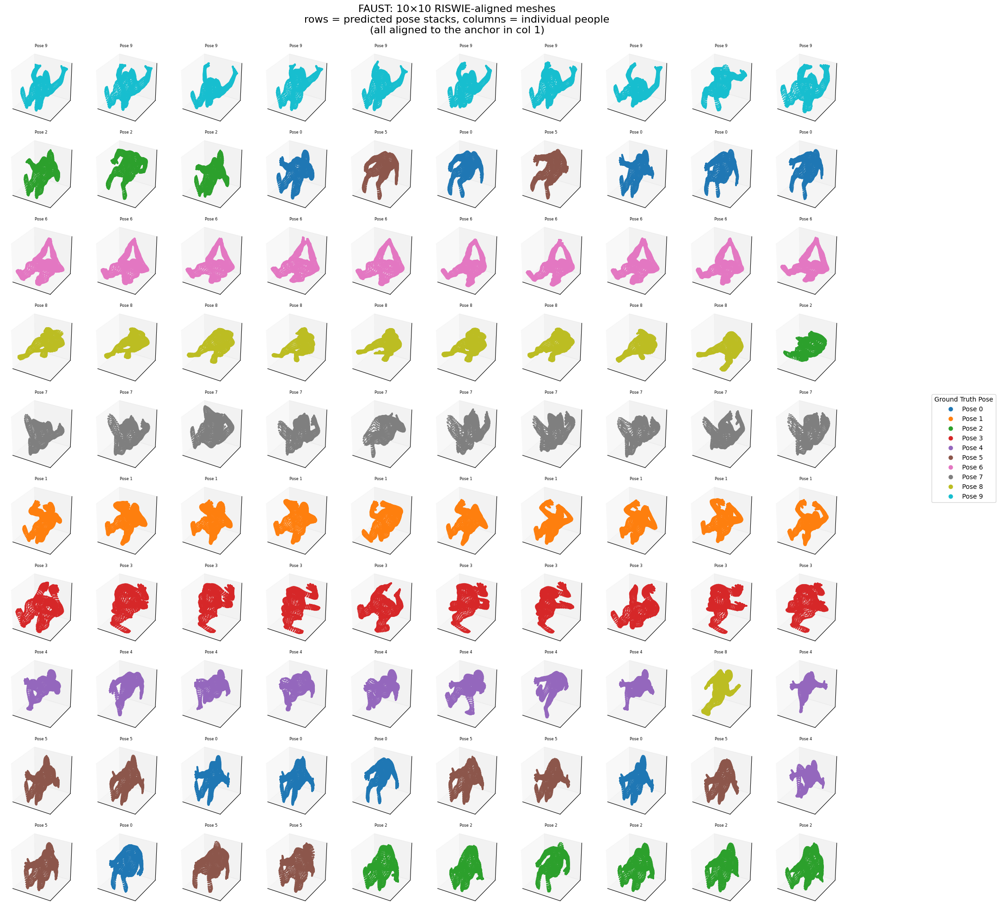

In [6]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401, needed for 3D projection
from matplotlib.lines import Line2D
import ot

# — assume you’ve already run the FAUST clustering code —
# stacks: List of 10 lists, each list contains the 10 mesh-indices for that pose
# row_ind, col_ind: Hungarian matching from predicted stacks to true poses
# verts_array: shape (100, N_VERTS, 3)
# compute_alignment_rotation: your existing 3D RISWIE alignment function

# ==== define a color map for the 10 ground-truth poses ====
pose_cmap = plt.get_cmap("tab10")
pose_color_map = {pose: pose_cmap(pose) for pose in range(10)}

# ==== create 10×10 3D subplots ====
fig = plt.figure(figsize=(20, 20))
axes = {}
for row in range(10):
    for col in range(10):
        ax = fig.add_subplot(10, 10, row*10 + col + 1, projection="3d")
        axes[(row, col)] = ax

# ==== fill in each cell: align to the first mesh in its stack ====
for row, (pred_k, true_k) in enumerate(zip(row_ind, col_ind)):
    pred_stack = stacks[pred_k]
    # anchor mesh for this pose
    anchor_idx = pred_stack[0]
    X_anchor = verts_array[anchor_idx]
    Xc_anchor = X_anchor - X_anchor.mean(axis=0)

    for col, mesh_idx in enumerate(pred_stack):
        V = verts_array[mesh_idx]
        Vc = V - V.mean(axis=0)

        if col == 0:
            pts = Xc_anchor
        else:
            # align to anchor via your RISWIE-based rotation
            R = compute_alignment_rotation(Xc_anchor, Vc, k=3)
            pts = Vc @ R

        ax = axes[(row, col)]
        color = pose_color_map[mesh_idx % 10]
        ax.scatter(
            pts[:, 0], pts[:, 1], pts[:, 2],
            c=[color], s=1, alpha=0.8
        )
        ax.set_title(f"Pose {mesh_idx % 10}", fontsize=6)
        ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([])
        ax.set_box_aspect((1,1,1))

# ==== add legend for ground-truth poses ====
legend_elems = [
    Line2D([0], [0], marker="o", color="w",
           label=f"Pose {p}",
           markerfacecolor=pose_color_map[p],
           markersize=8)
    for p in range(10)
]
fig.legend(
    handles=legend_elems,
    title="Ground Truth Pose",
    bbox_to_anchor=(1.01, 0.5),
    loc="center left",
    fontsize=10
)

plt.suptitle(
    "FAUST: 10×10 RISWIE-aligned meshes\nrows = predicted pose stacks, columns = individual people\n(all aligned to the anchor in col 1)",
    fontsize=16
)
plt.tight_layout()
plt.subplots_adjust(right=0.92, top=0.93)
plt.show()


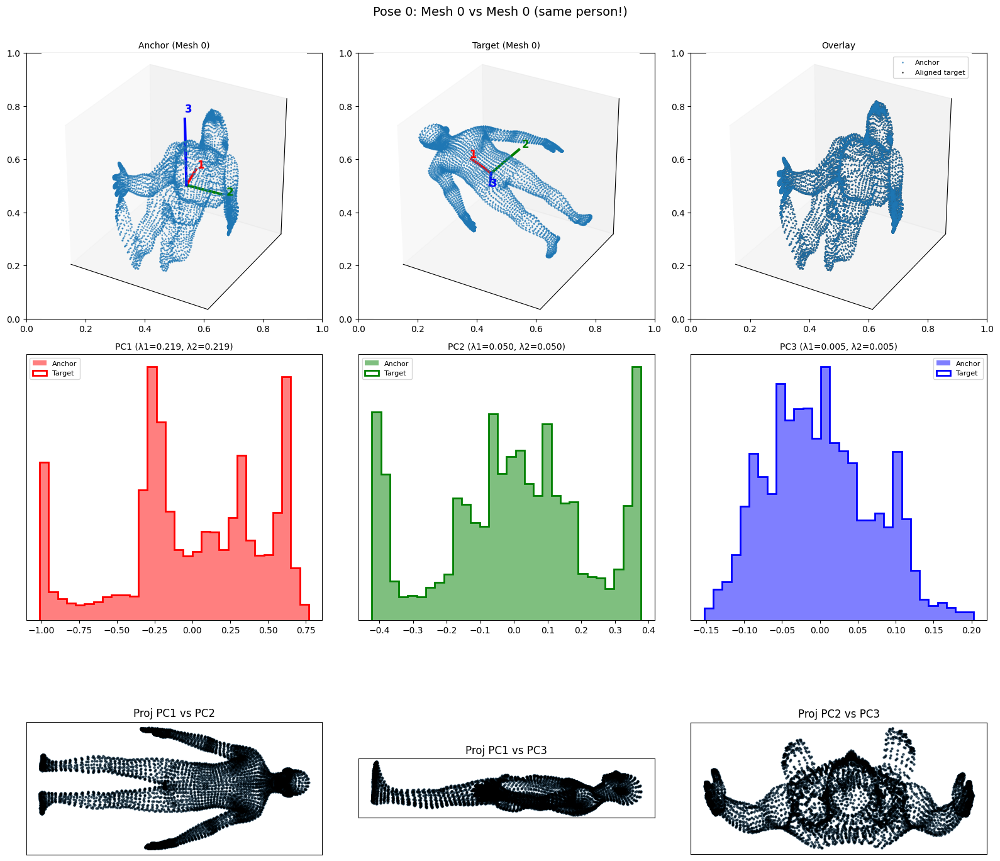

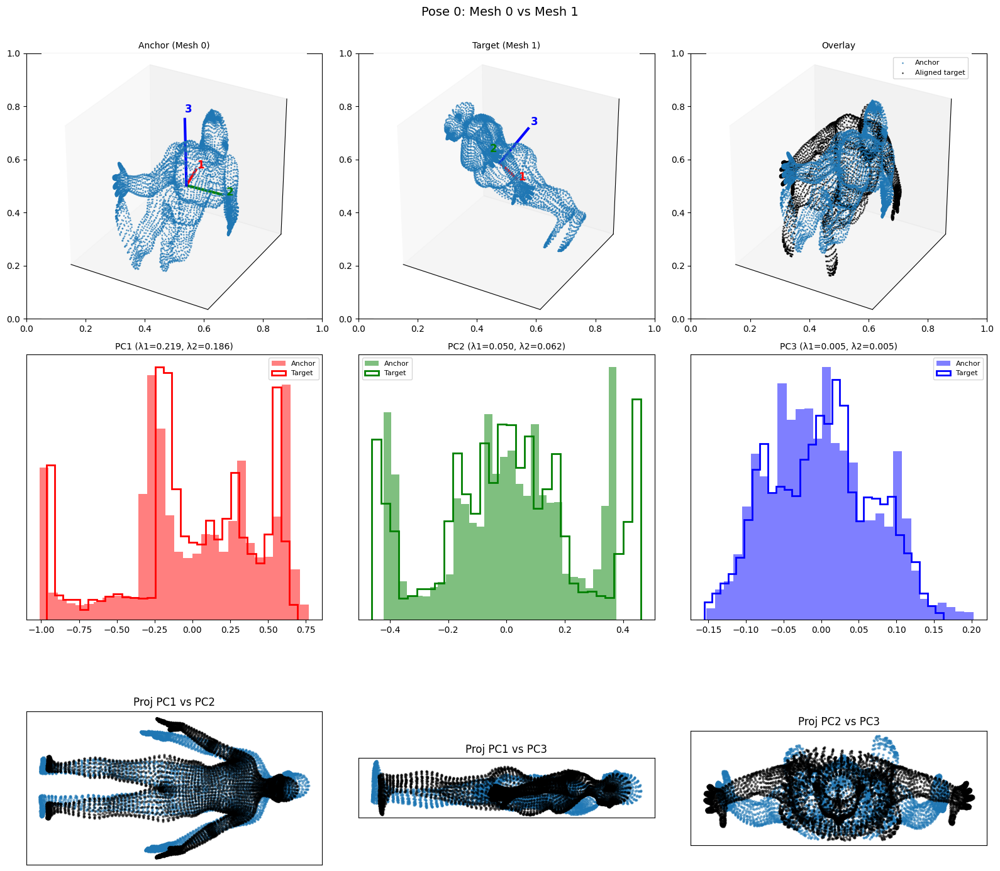

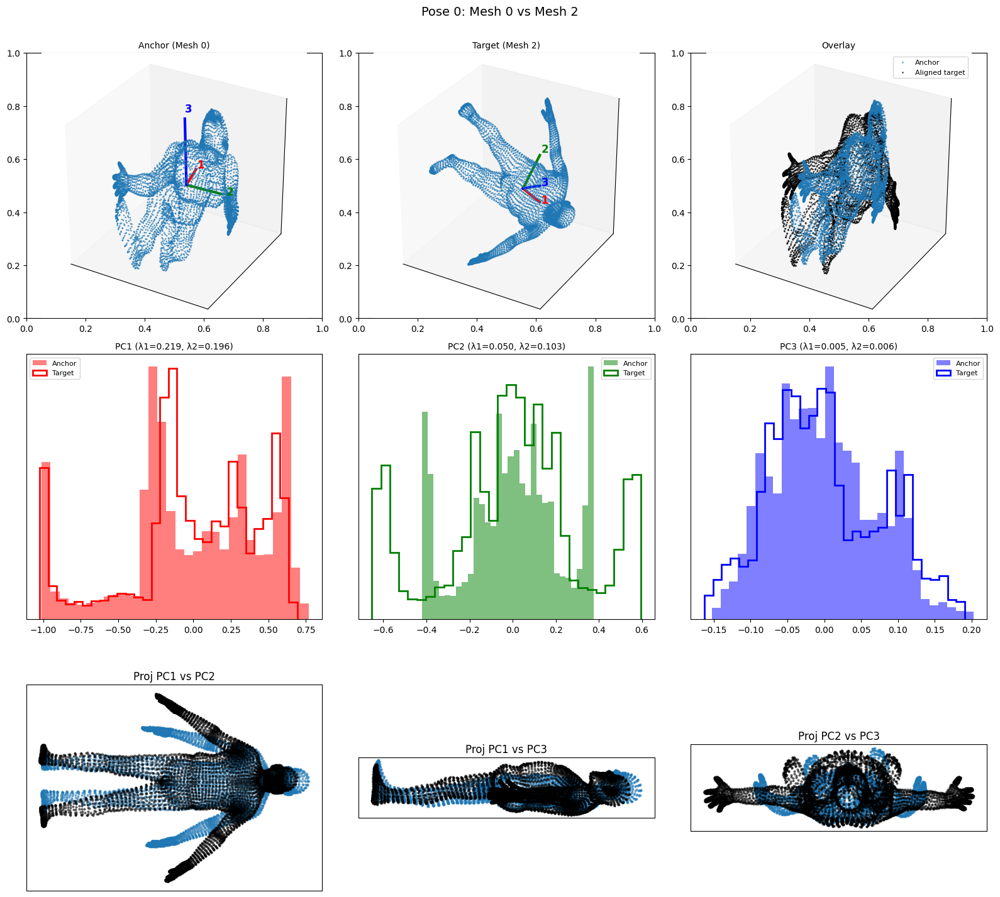

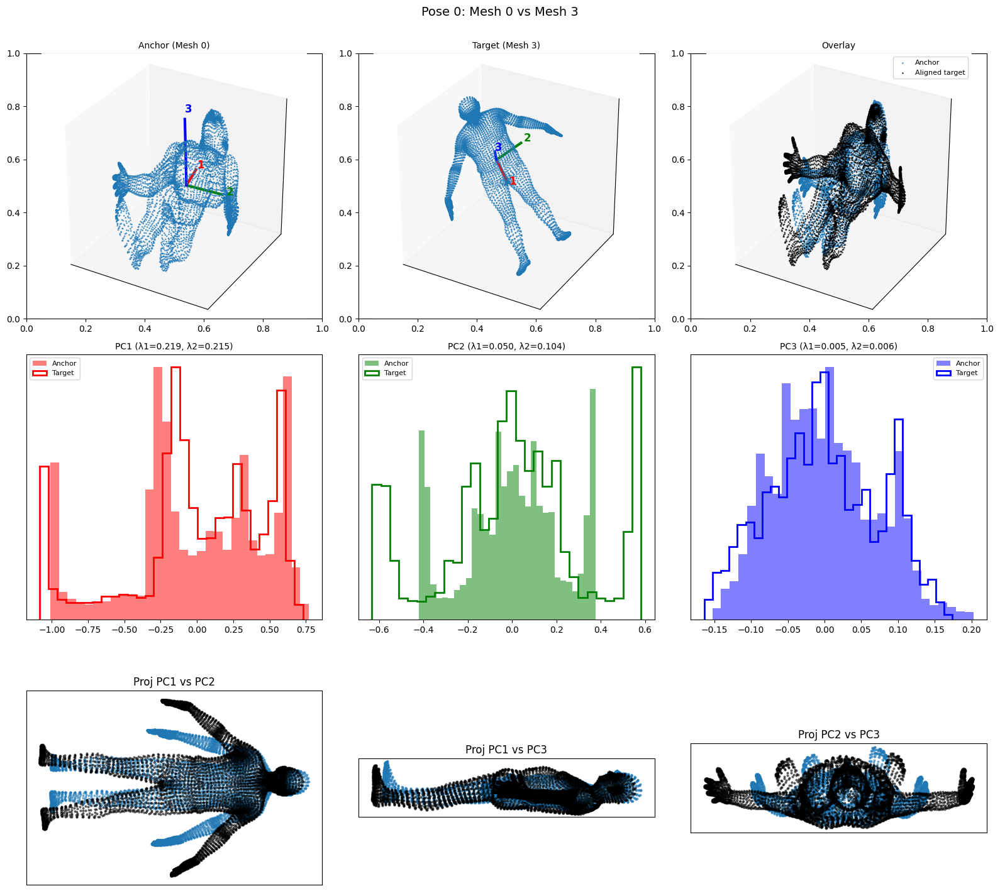

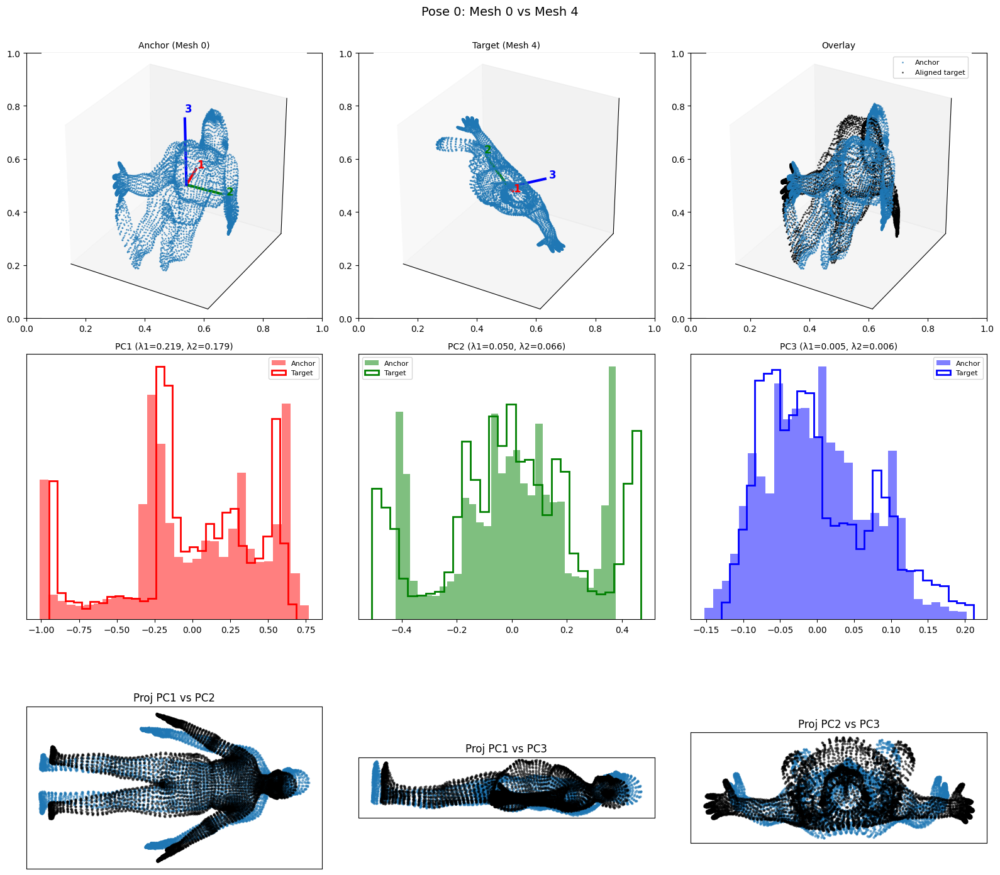

...

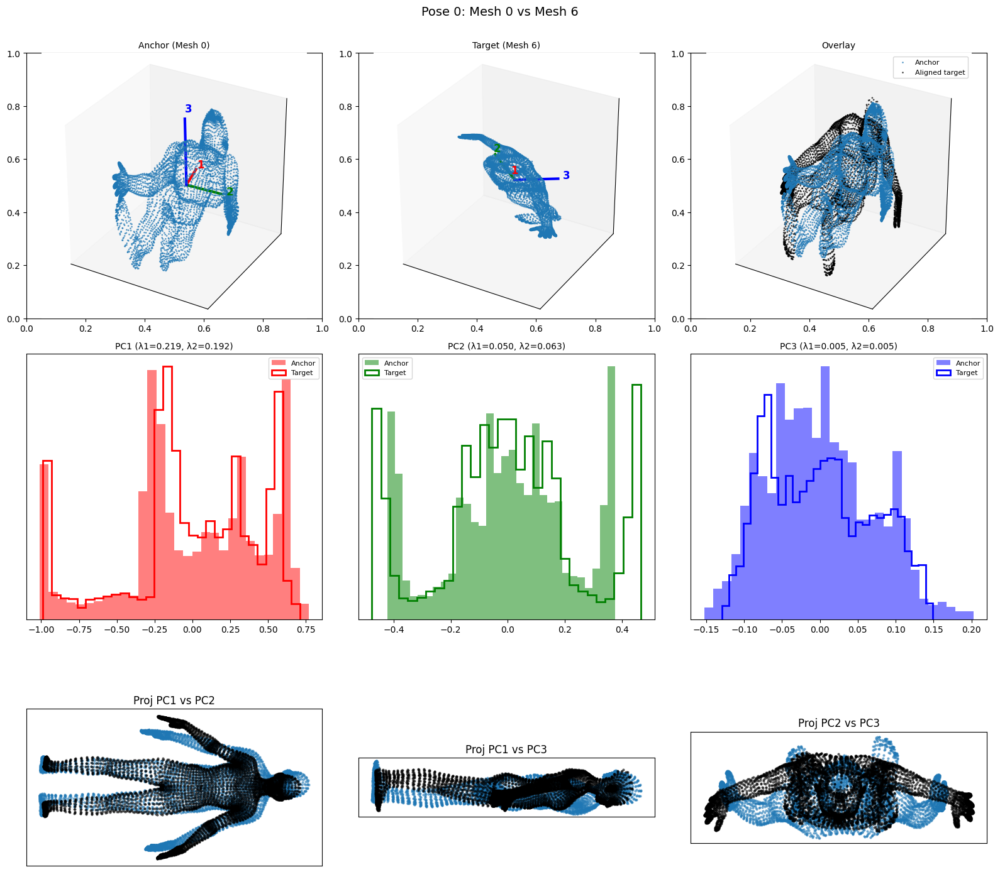

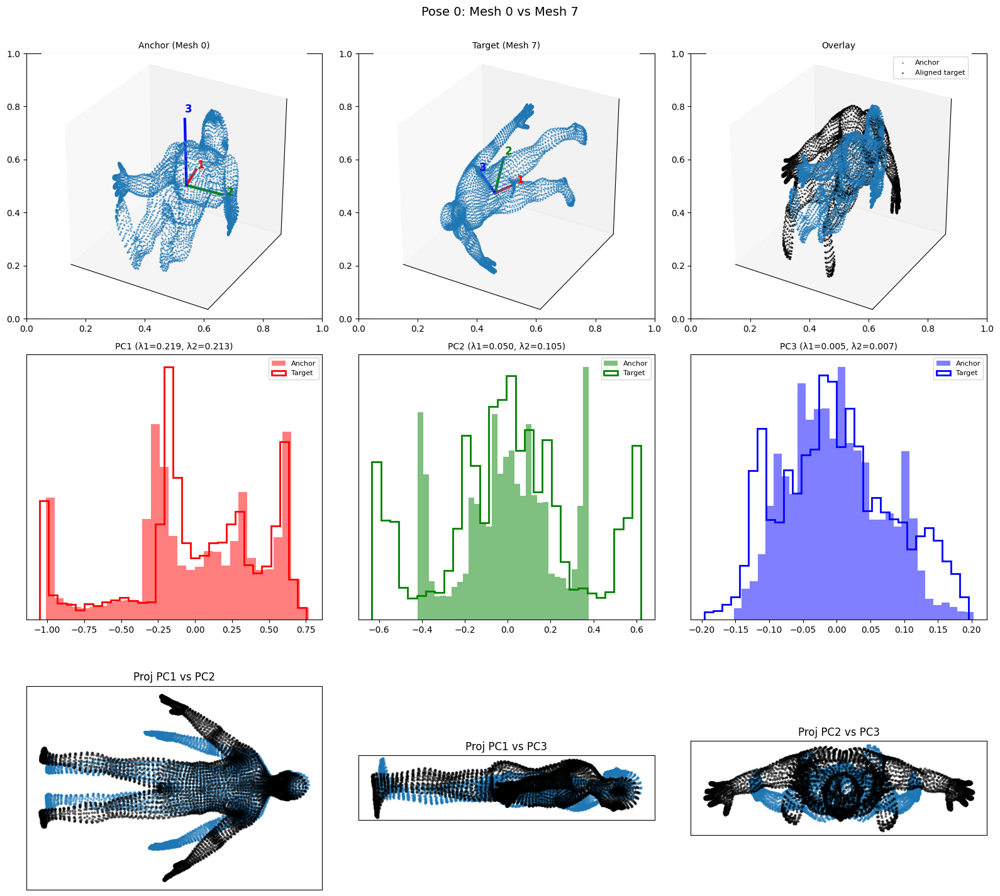

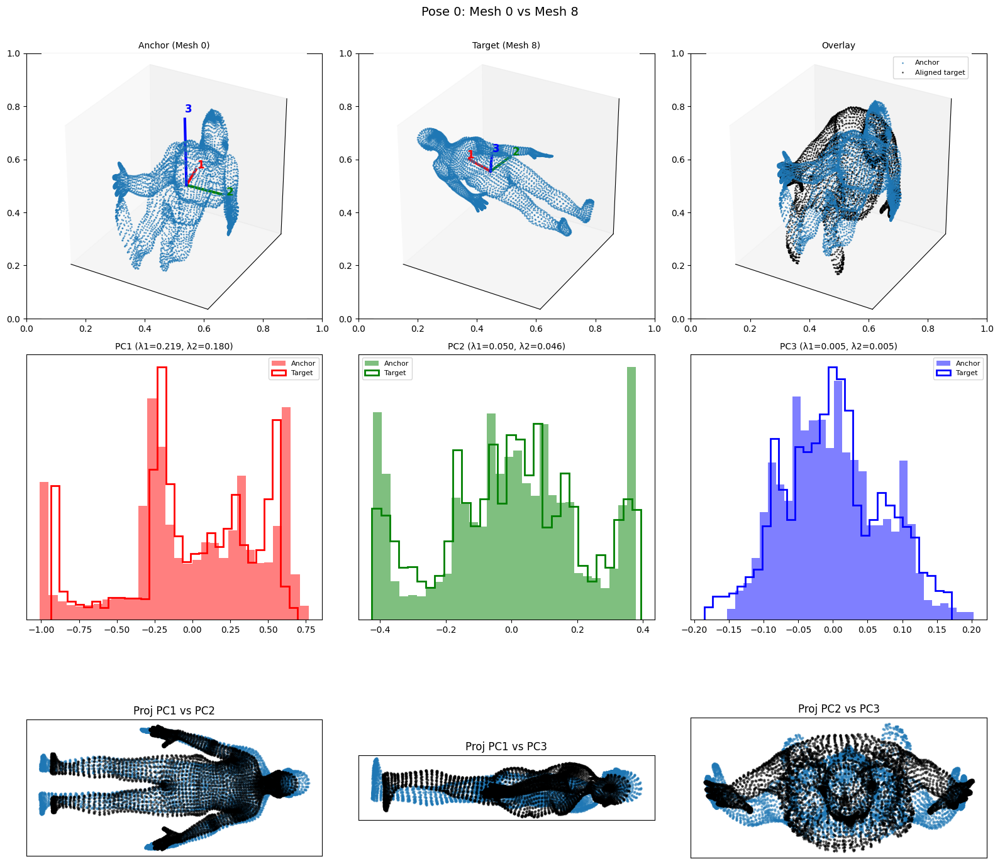

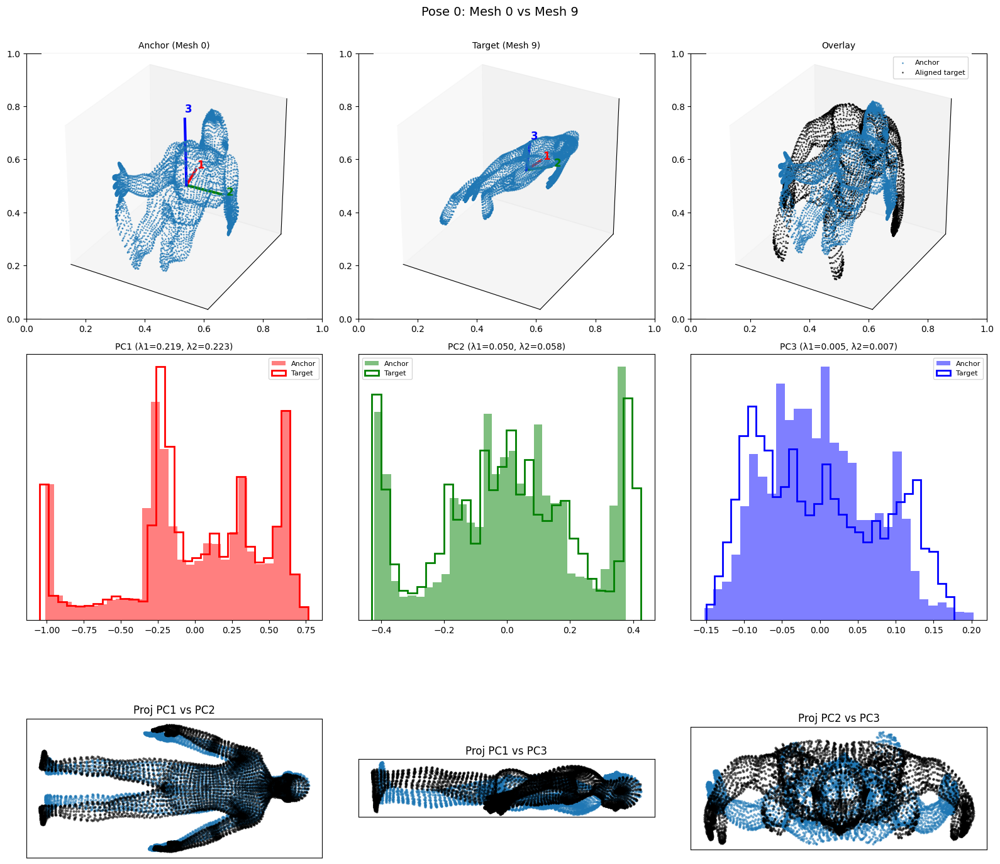

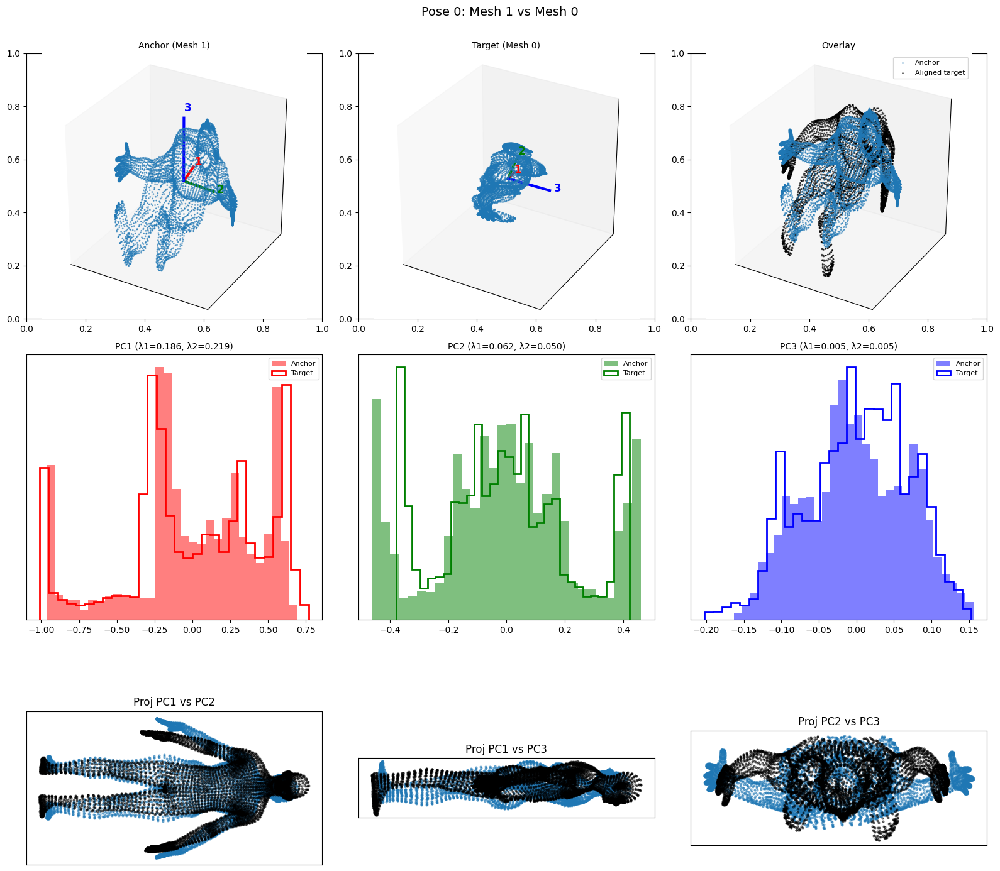

KeyboardInterrupt: 

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
from sklearn.decomposition import PCA
from scipy.stats import wasserstein_distance

pose_cmap = plt.get_cmap("tab10")
pose_color_map = {pose: pose_cmap(pose) for pose in range(10)}

def random_rotation_matrix():
    # Uniform random rotation
    rand_rot = np.linalg.qr(np.random.randn(3, 3))[0]
    # With 50% chance, flip axes
    for i in range(3):
        if np.random.rand() < 0.5:
            rand_rot[:, i] *= -1
    return rand_rot

N_PEOPLE = 10
N_POSES = 10
np.random.seed(42)

for pose in range(N_POSES):
    indices = [i for i in range(len(verts_array)) if (i % 10) == pose]
    for idx1 in indices:
        for idx2 in indices:
            V1 = verts_array[idx1] - verts_array[idx1].mean(axis=0)
            V2 = verts_array[idx2] - verts_array[idx2].mean(axis=0)
            # Random rotations for both anchor and target
            R1 = random_rotation_matrix()
            R2 = random_rotation_matrix()
            V1r = V1 # no rotation for anchor
            V2r = V2 @ R2

            # PCA on each (after random rotation)
            pca1 = PCA(n_components=3).fit(V1r)
            eigvals1 = pca1.explained_variance_
            axes1 = pca1.components_.T
            pca2 = PCA(n_components=3).fit(V2r)
            eigvals2 = pca2.explained_variance_
            axes2 = pca2.components_.T

            # Align target (random-rotated) to anchor (random-rotated)
            R_align = compute_alignment_rotation(V1r, V2r, k=3)
            V2_al = V2r @ R_align
            pca_al = PCA(n_components=3).fit(V2_al)
            eigvals_al = pca_al.explained_variance_
            axes_al = pca_al.components_.T

            fig, axs = plt.subplots(3, 3, figsize=(16, 15))
            fig.subplots_adjust(hspace=0.33)

            # (1) Anchor 3D with axes
            ax = axs[0,0] = fig.add_subplot(3,3,1, projection='3d')
            ax.scatter(V1r[:,0], V1r[:,1], V1r[:,2], c=[pose_color_map[pose]], s=1, alpha=0.6)
            scale1 = np.linalg.norm(V1r, axis=1).mean() * 0.5
            for a, col, lab in zip(range(3), ['r','g','b'], ['1','2','3']):
                vec = axes1[:, a]
                ax.plot([0, vec[0]*scale1],[0, vec[1]*scale1],[0, vec[2]*scale1], col, linewidth=3)
                ax.text(vec[0]*scale1*1.1, vec[1]*scale1*1.1, vec[2]*scale1*1.1, lab, color=col, fontsize=12, weight='bold')
            ax.set_title(f"Anchor (Mesh {idx1//10})", fontsize=10)
            ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([]); ax.set_box_aspect((1,1,1))

            # (2) Target 3D with axes
            ax = axs[0,1] = fig.add_subplot(3,3,2, projection='3d')
            ax.scatter(V2r[:,0], V2r[:,1], V2r[:,2], c=[pose_color_map[pose]], s=1, alpha=0.6)
            scale2 = np.linalg.norm(V2r, axis=1).mean() * 0.5
            for a, col, lab in zip(range(3), ['r','g','b'], ['1','2','3']):
                vec = axes2[:, a]
                ax.plot([0, vec[0]*scale2],[0, vec[1]*scale2],[0, vec[2]*scale2], col, linewidth=3)
                ax.text(vec[0]*scale2*1.1, vec[1]*scale2*1.1, vec[2]*scale2*1.1, lab, color=col, fontsize=12, weight='bold')
            ax.set_title(f"Target (Mesh {idx2//10})", fontsize=10)
            ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([]); ax.set_box_aspect((1,1,1))

            # (3) Overlay
            ax = axs[0,2] = fig.add_subplot(3,3,3, projection='3d')
            ax.scatter(V1r[:,0], V1r[:,1], V1r[:,2], c=[pose_color_map[pose]], s=1, alpha=0.6, label="Anchor")
            ax.scatter(V2_al[:,0], V2_al[:,1], V2_al[:,2], c='k', s=1, alpha=0.6, label="Aligned target")
            ax.set_title("Overlay", fontsize=10)
            ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([]); ax.set_box_aspect((1,1,1))
            ax.legend(fontsize=8, loc="upper right")

            # (4-6) 1D histograms for PC1, PC2, PC3 (sign of target chosen to minimize W2)
            bins = 30
            for a, color, ax in zip(range(3), ['r','g','b'], axs[1]):
                proj1 = V1r @ axes1[:, a]
                proj2 = V2_al @ axes_al[:, a]
                if wasserstein_distance(proj1, proj2) > wasserstein_distance(proj1, -proj2):
                    proj2 = -proj2
                ax.hist(proj1, bins=bins, color=color, alpha=0.5, label='Anchor')
                ax.hist(proj2, bins=bins, histtype='step', color=color, linewidth=2, label='Target')
                ax.set_title(f"PC{a+1} (λ1={eigvals1[a]:.3f}, λ2={eigvals_al[a]:.3f})", fontsize=10)
                ax.set_yticks([]); ax.legend(fontsize=8)

            # (7-9) All 2D projections: (PC1,PC2), (PC1,PC3), (PC2,PC3)
            for (i, j), ax in zip([(0,1),(0,2),(1,2)], axs[2]):
                ax.scatter((V1r @ axes1[:,i]), (V1r @ axes1[:,j]), c=[pose_color_map[pose]], s=4, alpha=0.5, label='Anchor')
                ax.scatter((V2_al @ axes_al[:,i]), (V2_al @ axes_al[:,j]), c='k', s=4, alpha=0.5, label='Target')
                ax.set_title(f"Proj PC{i+1} vs PC{j+1}")
                ax.set_aspect('equal','box'); ax.set_xticks([]); ax.set_yticks([])

            same_note = " (same person!)" if idx1 == idx2 else ""
            plt.suptitle(
                f"Pose {pose}: Mesh {idx1//10} vs Mesh {idx2//10}{same_note}",
                fontsize=14
            )
            plt.tight_layout()
            plt.subplots_adjust(top=0.93)
            plt.show()


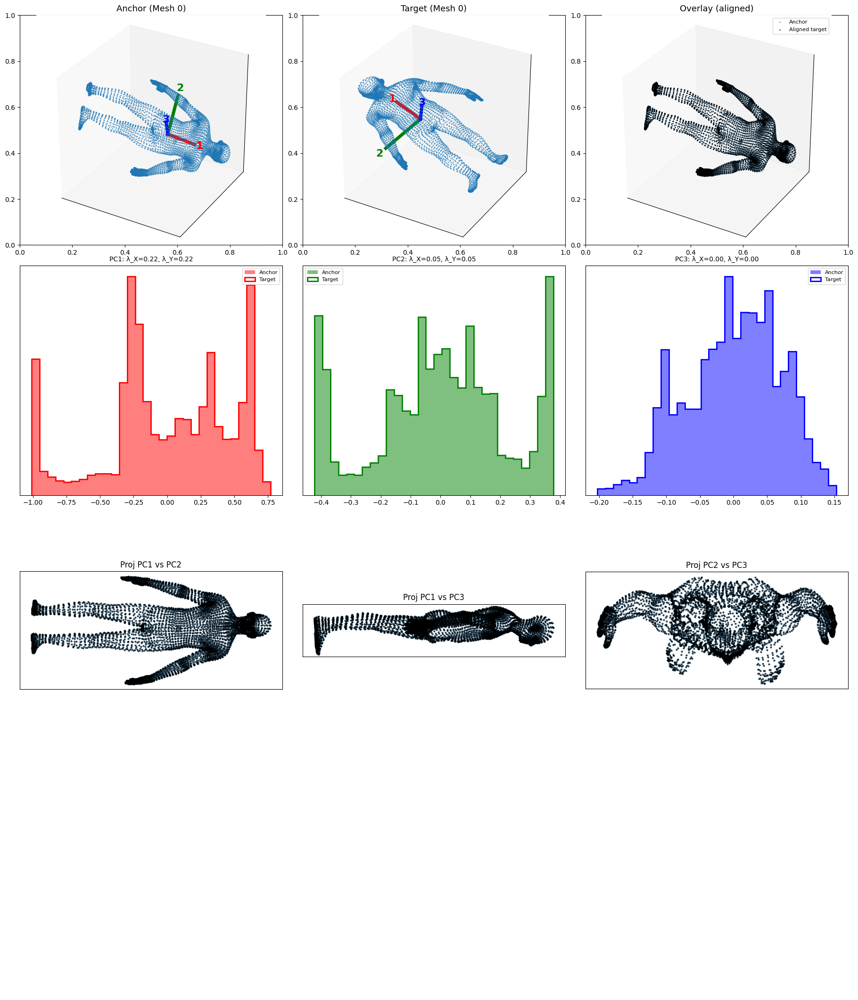

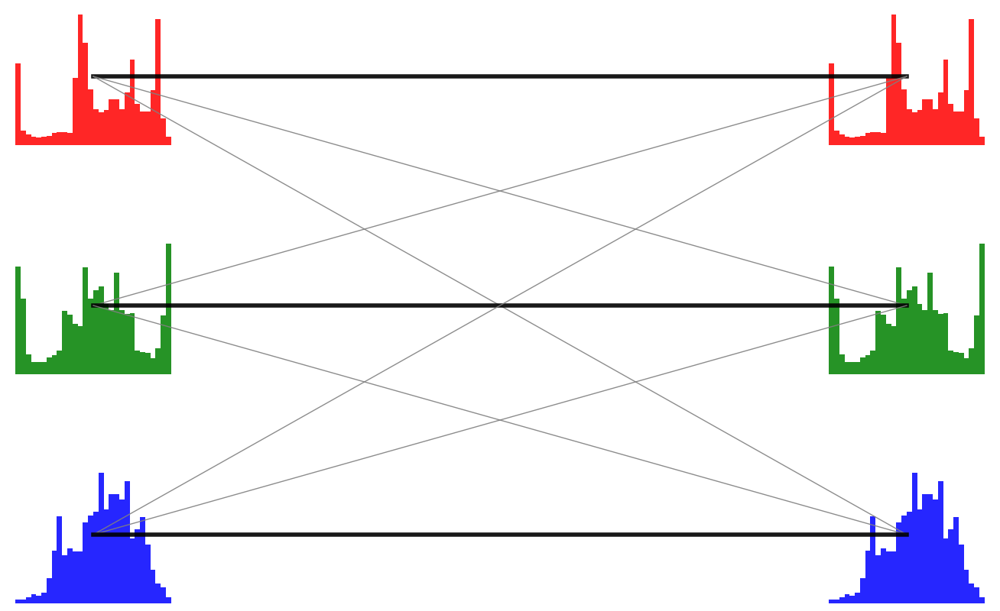


All pairwise W2^2(pos/neg) between X and Y axes (scaled by 100 for educational purposes):
  X0 - Y0: 0.00 / 2.59
  X0 - Y1: 6.34 / 6.64
  X0 - Y2: 16.02 / 16.11
  X1 - Y0: 6.34 / 6.64
  X1 - Y1: 0.00 / 0.06
  X1 - Y2: 2.41 / 2.44
  X2 - Y0: 16.02 / 16.11
  X2 - Y1: 2.41 / 2.44
  X2 - Y2: 0.00 / 0.01


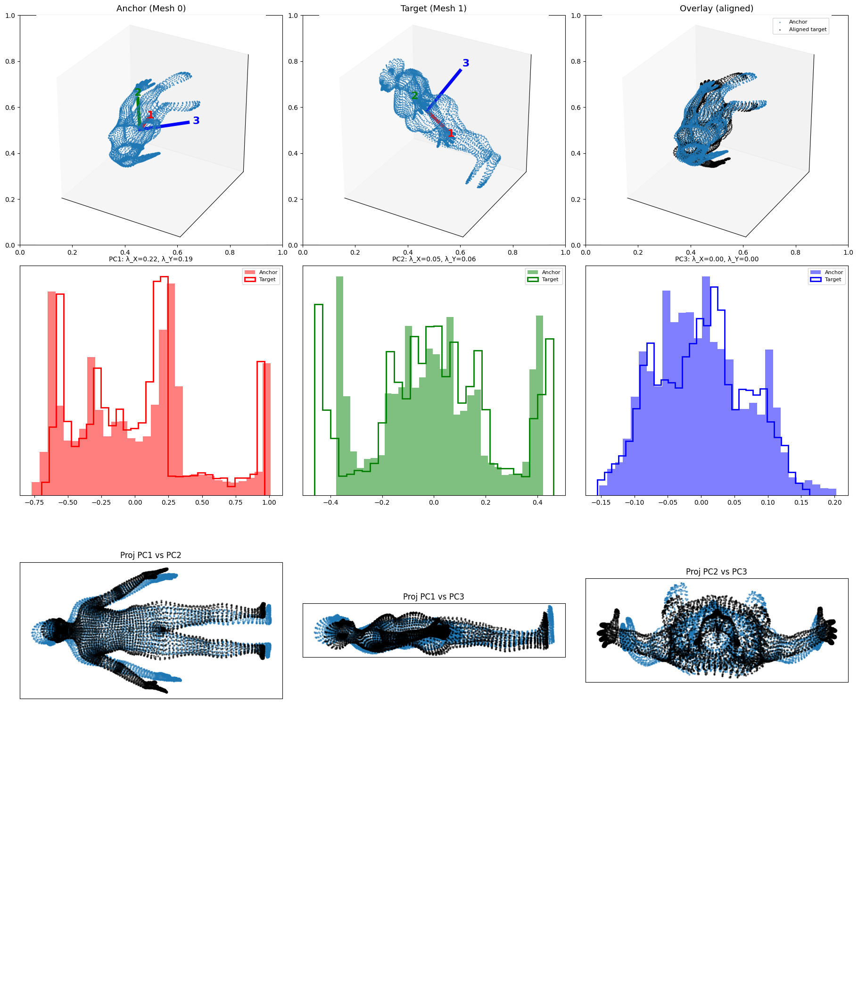

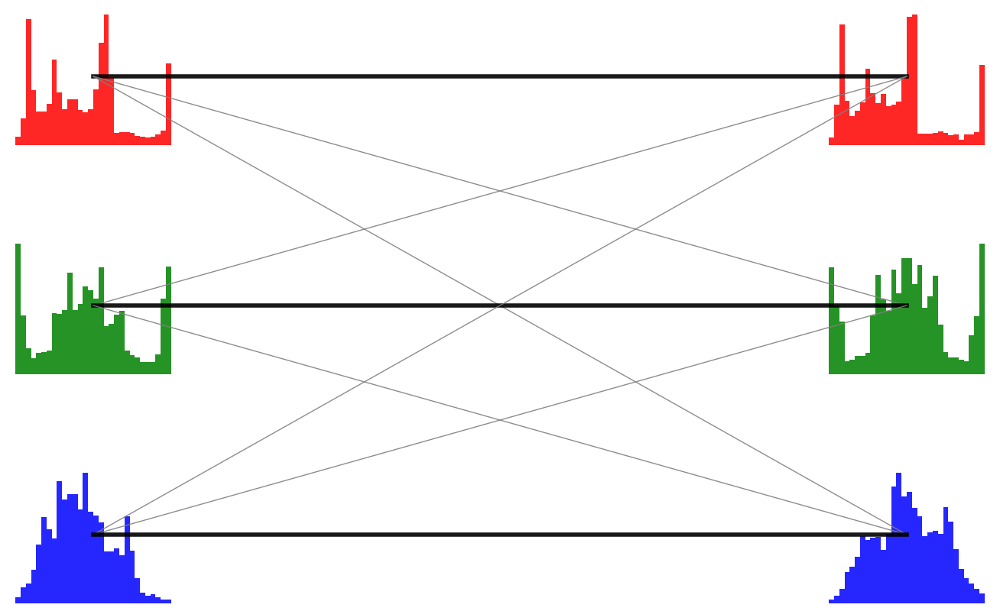


All pairwise W2^2(pos/neg) between X and Y axes (scaled by 100 for educational purposes):
  X0 - Y0: 0.23 / 2.99
  X0 - Y1: 5.32 / 5.37
  X0 - Y2: 16.20 / 16.17
  X1 - Y0: 4.68 / 5.02
  X1 - Y1: 0.09 / 0.09
  X1 - Y2: 2.47 / 2.47
  X2 - Y0: 13.27 / 13.39
  X2 - Y1: 3.27 / 3.28
  X2 - Y2: 0.01 / 0.00


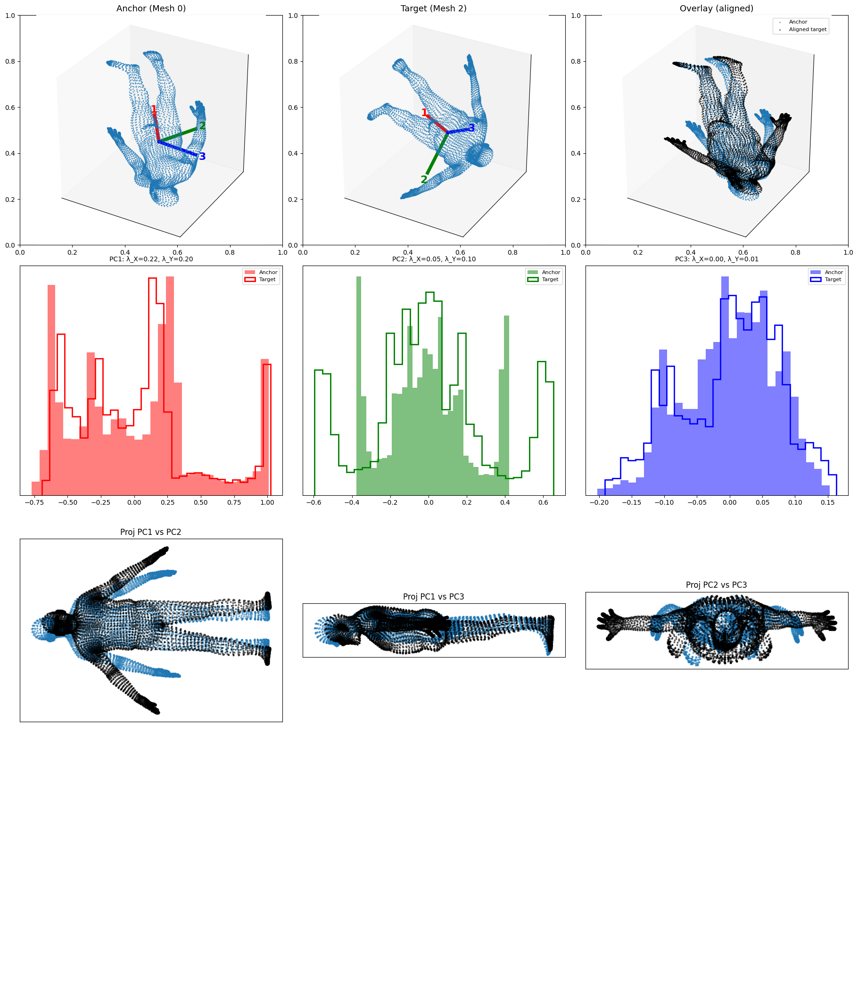

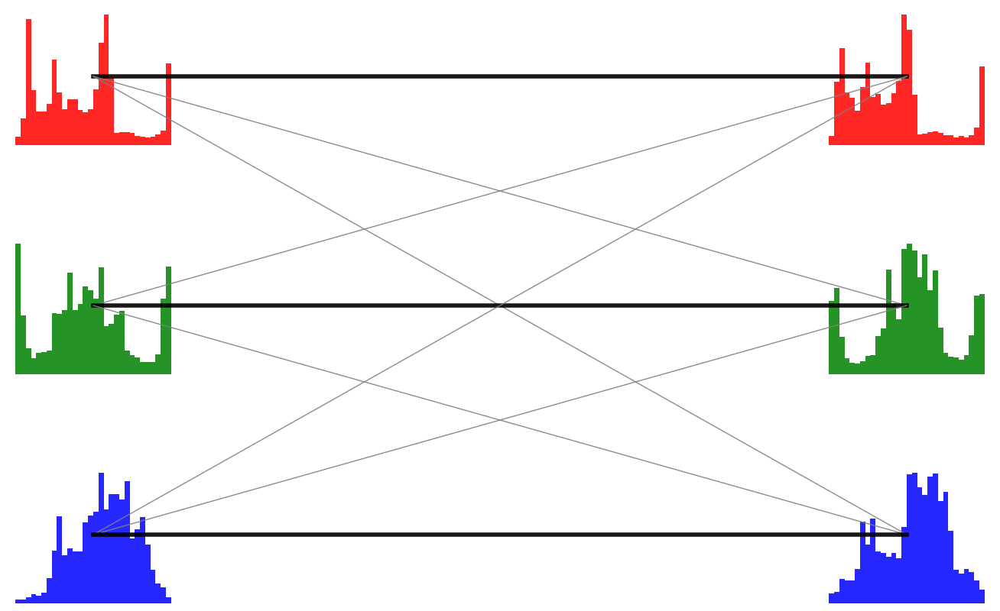


All pairwise W2^2(pos/neg) between X and Y axes (scaled by 100 for educational purposes):
  X0 - Y0: 0.25 / 3.32
  X0 - Y1: 3.22 / 2.89
  X0 - Y2: 15.58 / 15.51
  X1 - Y0: 5.20 / 5.62
  X1 - Y1: 1.09 / 1.00
  X1 - Y2: 2.25 / 2.21
  X2 - Y0: 14.22 / 14.07
  X2 - Y1: 6.39 / 6.43
  X2 - Y2: 0.01 / 0.03


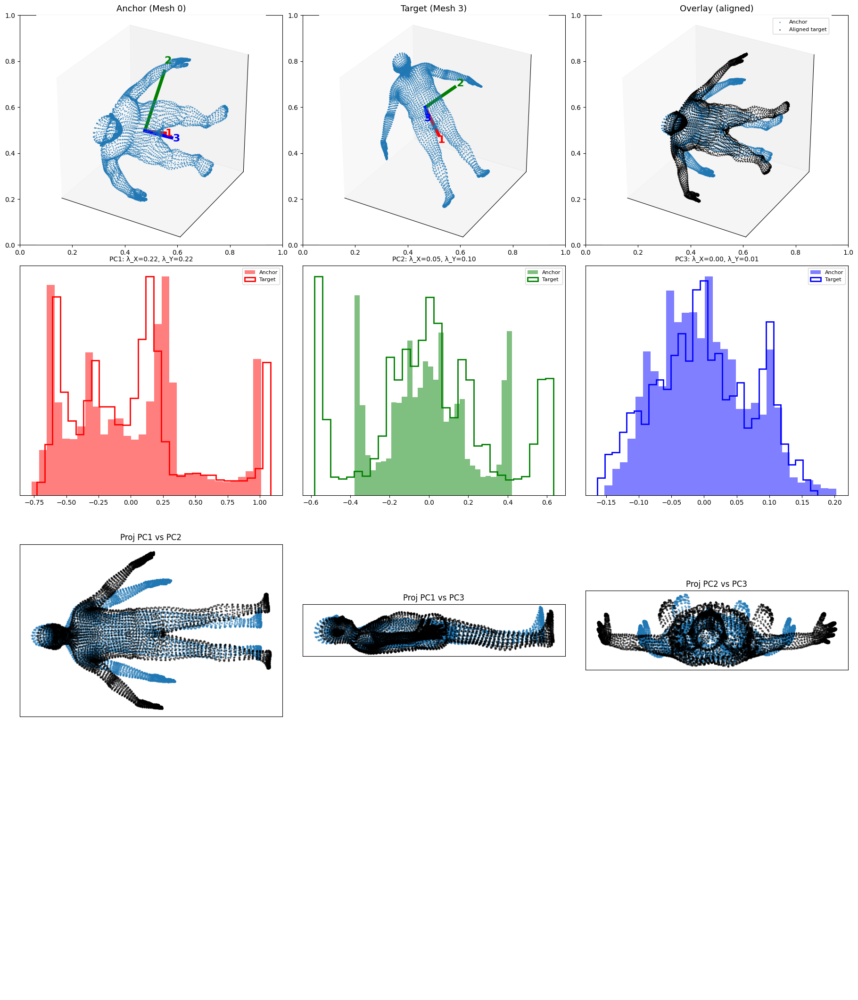

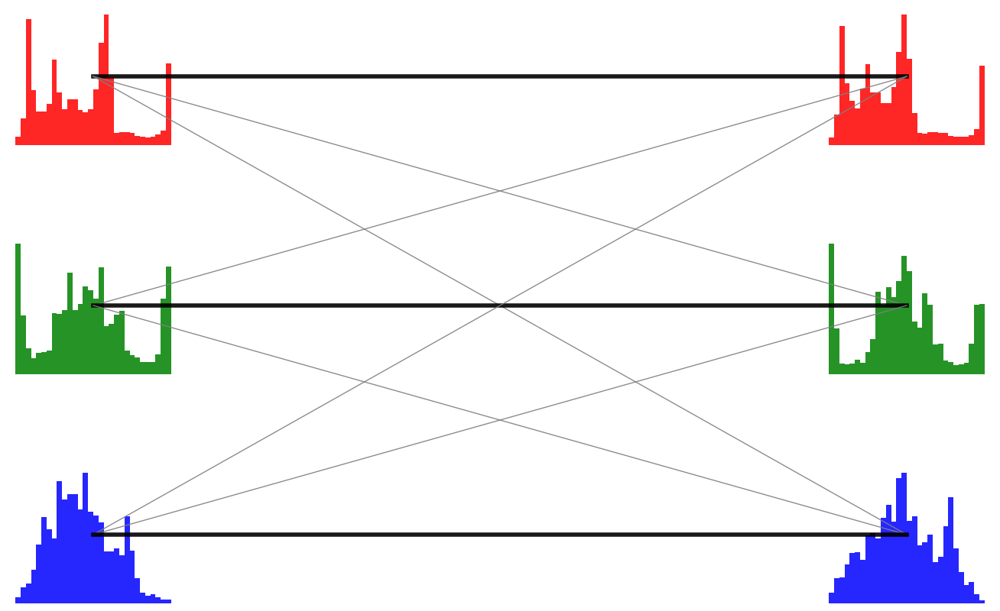


All pairwise W2^2(pos/neg) between X and Y axes (scaled by 100 for educational purposes):
  X0 - Y0: 0.28 / 3.57
  X0 - Y1: 2.85 / 3.04
  X0 - Y2: 15.67 / 15.62
  X1 - Y0: 6.23 / 6.70
  X1 - Y1: 1.04 / 1.07
  X1 - Y2: 2.25 / 2.25
  X2 - Y0: 15.75 / 15.92
  X2 - Y1: 6.51 / 6.53
  X2 - Y2: 0.01 / 0.01


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from scipy.optimize import linear_sum_assignment
from scipy.stats import wasserstein_distance

# ------------- Dummy data for demonstration -------------
N_PEOPLE, N_POSES = 10, 10
N_VERTS = 6890
verts_array = np.stack(verts_list, axis=0)  # shape: (100, N_VERTS, 3)
def compute_alignment_rotation(X, Y, k=3):
    Xc, Yc = X - X.mean(0), Y - Y.mean(0)
    U, _, VT = np.linalg.svd(Yc.T @ Xc)
    return U @ VT
# --------------------------------------------------------

pose_cmap = plt.get_cmap("tab10")
pose_color_map = {p: pose_cmap(p) for p in range(10)}

def random_rotation_matrix():
    R, _ = np.linalg.qr(np.random.randn(3,3))
    for i in range(3):
        if np.random.rand() < 0.5:
            R[:,i] *= -1
    return R

def compute_w2_sq(a, b):
    return np.mean((a - b)**2)

def get_sorted_columns(M):
    return [np.sort(M[:,i]) for i in range(M.shape[1])]

# ------------ FLAG HERE ------------
paired_histograms = True   # Change to False for the classic style
# ------------------------------------

np.random.seed(42)

for pose in range(N_POSES):
    idxs = [i for i in range(len(verts_array)) if i % 10 == pose]
    for idx1 in idxs:
        for idx2 in idxs:
            # --- 1. center & random-rotate ---
            V1 = verts_array[idx1] - verts_array[idx1].mean(0)
            V2 = verts_array[idx2] - verts_array[idx2].mean(0)
            V1r = V1 @ random_rotation_matrix()
            V2r = V2 @ random_rotation_matrix()

            # --- 2. PCA ---
            pca1 = PCA(3).fit(V1r)
            eig1, A1 = pca1.explained_variance_, pca1.components_.T
            pca2 = PCA(3).fit(V2r)
            eig2, A2 = pca2.explained_variance_, pca2.components_.T

            # For plotting axes: find sign for target axes to minimize W2^2 to anchor's
            proj1 = [V1r @ A1[:,i] for i in range(3)]
            proj2 = [V2r @ A2[:,i] for i in range(3)]
            anchor_axes_sign = np.ones(3)
            target_axes_sign = []
            for i in range(3):
                w2_pos = wasserstein_distance(proj1[i], proj2[i])
                w2_neg = wasserstein_distance(proj1[i], -proj2[i])
                target_axes_sign.append(1 if w2_pos <= w2_neg else -1)
            target_axes_sign = np.array(target_axes_sign)
            axes1_plot = A1 * anchor_axes_sign
            axes2_plot = A2 * target_axes_sign

            # --- 3. RISWIE alignment ---
            R_align = compute_alignment_rotation(V1r, V2r, k=3)
            V2_al = V2r @ R_align

            # --- 4. RISWIE assignment for visualization ---
            pca_al = PCA(3).fit(V2_al)
            eig_al, A_al = pca_al.explained_variance_, pca_al.components_.T
            k = 3
            AX = V1r @ A1
            BY = V2_al @ A_al
            AX_s = get_sorted_columns(AX)
            BY_s = get_sorted_columns(BY)
            pos_cost = np.zeros((k,k))
            neg_cost = np.zeros((k,k))
            C = np.zeros((k,k))
            for i in range(k):
                for j in range(k):
                    d_pos = compute_w2_sq(AX_s[i], BY_s[j])
                    d_neg = compute_w2_sq(AX_s[i], -BY_s[j][::-1])
                    pos_cost[i,j], neg_cost[i,j] = d_pos, d_neg
                    C[i,j] = min(d_pos, d_neg)
            row_ind, col_ind = linear_sum_assignment(C)

            # --- 5. Plot 3D with big, numbered axes + overlay ---
            nrows = 4 if paired_histograms else 3
            fig, axs = plt.subplots(nrows, 3, figsize=(18, 16 if not paired_histograms else 21))
            fig.subplots_adjust(hspace=0.32, wspace=0.22)
            # (1) Anchor 3D
            ax = axs[0,0]
            ax = fig.add_subplot(nrows,3,1, projection='3d')
            ax.scatter(V1r[:,0], V1r[:,1], V1r[:,2], c=[pose_color_map[pose]], s=1, alpha=0.6)
            scale1 = np.linalg.norm(V1r, axis=1).mean() * 0.7
            for a, col, lab in zip(range(3), ['r','g','b'], ['1','2','3']):
                vec = axes1_plot[:, a]
                ax.plot([0, vec[0]*scale1],[0, vec[1]*scale1],[0, vec[2]*scale1], col, linewidth=5)
                ax.text(vec[0]*scale1*1.18, vec[1]*scale1*1.18, vec[2]*scale1*1.18, lab,
                        color=col, fontsize=16, weight='bold', ha='center', va='center')
            ax.set_title(f"Anchor (Mesh {idx1//10})", fontsize=13)
            ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([]); ax.set_box_aspect((1,1,1))

            # (2) Target 3D
            ax = axs[0,1]
            ax = fig.add_subplot(nrows,3,2, projection='3d')
            ax.scatter(V2r[:,0], V2r[:,1], V2r[:,2], c=[pose_color_map[pose]], s=1, alpha=0.6)
            scale2 = np.linalg.norm(V2r, axis=1).mean() * 0.7
            for a, col, lab in zip(range(3), ['r','g','b'], ['1','2','3']):
                vec = axes2_plot[:, a]
                ax.plot([0, vec[0]*scale2],[0, vec[1]*scale2],[0, vec[2]*scale2], col, linewidth=5)
                ax.text(vec[0]*scale2*1.18, vec[1]*scale2*1.18, vec[2]*scale2*1.18, lab,
                        color=col, fontsize=16, weight='bold', ha='center', va='center')
            ax.set_title(f"Target (Mesh {idx2//10})", fontsize=13)
            ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([]); ax.set_box_aspect((1,1,1))

            # (3) Overlay (RISWIE aligned)
            ax = axs[0,2]
            ax = fig.add_subplot(nrows,3,3, projection='3d')
            ax.scatter(V1r[:,0], V1r[:,1], V1r[:,2], c=[pose_color_map[pose]], s=1, alpha=0.6, label='Anchor')
            ax.scatter(V2_al[:,0], V2_al[:,1], V2_al[:,2], c='k', s=1, alpha=0.6, label='Aligned target')
            ax.set_title("Overlay (aligned)", fontsize=13)
            ax.set_xticks([]); ax.set_yticks([]); ax.set_zticks([])
            ax.set_box_aspect((1,1,1))
            ax.legend(fontsize=8)

            bins = 30

            if not paired_histograms:
                # (4-6) 1D histograms for X/anchor axes
                for a in range(3):
                    ax = axs[1,a]
                    ax.hist(AX[:,a], bins=30, color=['r','g','b'][a], alpha=0.7)
                    ax.set_title(f"X PC{a+1}\nλ={eig1[a]:.2f}")
                    ax.set_yticks([])

                # (7-9) 1D histograms for Y/target (after alignment)
                for a in range(3):
                    ax = axs[2,a]
                    ax.hist(BY[:,a], bins=30, color=['r','g','b'][a], alpha=0.7)
                    ax.set_title(f"Y PC{a+1}\nλ={eig_al[a]:.2f}")
                    ax.set_yticks([])
            else:
                # (1 row) Aligned histogram pairs (PC1,2,3)
                for a, color, ax in zip(range(3), ['r','g','b'], axs[1]):
                    proj1 = AX[:,a]
                    proj2 = BY[:,a]
                    if wasserstein_distance(proj1, proj2) > wasserstein_distance(proj1, -proj2):
                        proj2 = -proj2
                    ax.hist(proj1, bins=bins, color=color, alpha=0.5, label='Anchor')
                    ax.hist(proj2, bins=bins, histtype='step', color=color, linewidth=2, label='Target')
                    ax.set_title(f"PC{a+1}: λ_X={eig1[a]:.2f}, λ_Y={eig_al[a]:.2f}", fontsize=10)
                    ax.set_yticks([]); ax.legend(fontsize=8)

                # (2 row) 2D projections: (PC1,PC2), (PC1,PC3), (PC2,PC3)
                for idx, (i, j) in enumerate([(0,1),(0,2),(1,2)]):
                    ax = axs[2,idx]
                    x1, y1 = AX[:,i], AX[:,j]
                    x2, y2 = BY[:,i], BY[:,j]

                    # Find sign for target (reflection) to best align 2D
                    err_orig = np.linalg.norm(np.stack([x1-x2, y1-y2], axis=-1))
                    err_flip1 = np.linalg.norm(np.stack([x1-(-x2), y1-y2], axis=-1))
                    err_flip2 = np.linalg.norm(np.stack([x1-x2, y1-(-y2)], axis=-1))
                    err_flip_both = np.linalg.norm(np.stack([x1-(-x2), y1-(-y2)], axis=-1))
                    errors = [err_orig, err_flip1, err_flip2, err_flip_both]
                    flips = [(1,1), (-1,1), (1,-1), (-1,-1)]
                    best = np.argmin(errors)
                    sign_x, sign_y = flips[best]
                    x2_al, y2_al = sign_x*x2, sign_y*y2

                    ax.scatter(x1, y1, c=[pose_color_map[pose]], s=4, alpha=0.5, label='Anchor')
                    ax.scatter(x2_al, y2_al, c='k', s=4, alpha=0.5, label='Target')
                    ax.set_title(f"Proj PC{i+1} vs PC{j+1}")
                    ax.set_aspect('equal','box'); ax.set_xticks([]); ax.set_yticks([])

                # Fill last row with blank axes (or can use for info)
                for ax in axs[3,:]:
                    ax.axis('off')

            #plt.suptitle(f"Pose {pose}: Mesh {idx1//10} vs Mesh {idx2//10}", fontsize=16)
            #plt.tight_layout()
            plt.tight_layout(pad=0.0)  # smaller pad value
            #plt.subplots_adjust(bottom=0.05, top=0.95, left=0.05, right=0.95, wspace=0.05)
            plt.show()

            # --- Bipartite plot as separate figure ---
            fig_bip = plt.figure(figsize=(14, 10))
            n_axes = 3
            dist_height = 0.18
            y_centers = np.linspace(0.80, 0.20, n_axes)
            x_left = 0.21
            x_right = 0.79
            hist_ax_xs = []
            for i in range(n_axes):
                ax = fig_bip.add_axes([x_left-0.17, y_centers[i]-dist_height/2, 0.16, dist_height])
                ax.hist(AX[:,i], bins=30, color=['r','g','b'][i], alpha=0.85)
                ax.set_xticks([]); ax.set_yticks([])
                for s in ax.spines: ax.spines[s].set_visible(False)
                hist_ax_xs.append(ax)
            hist_ax_ys = []
            for i in range(n_axes):
                ax = fig_bip.add_axes([x_right+0.01, y_centers[i]-dist_height/2, 0.16, dist_height])
                ax.hist(BY[:,i], bins=30, color=['r','g','b'][i], alpha=0.85)
                ax.set_xticks([]); ax.set_yticks([])
                for s in ax.spines: ax.spines[s].set_visible(False)
                hist_ax_ys.append(ax)
            def fig_coords(ax):
                return ((ax.get_position().x0+ax.get_position().x1)/2,
                        (ax.get_position().y0+ax.get_position().y1)/2)
            for i in range(n_axes):
                (x0, y0) = fig_coords(hist_ax_xs[i])
                for j in range(n_axes):
                    (x1, y1) = fig_coords(hist_ax_ys[j])
                    lw = 4 if (i, j) in zip(row_ind, col_ind) else 1
                    color = 'k' if (i, j) in zip(row_ind, col_ind) else 'gray'
                    fig_bip.lines.append(plt.Line2D([x0, x1], [y0, y1], transform=fig_bip.transFigure,
                                                    color=color, lw=lw, zorder=1, alpha=0.9))
                    xm, ym = 0.5*(x0+x1), 0.5*(y0+y1)
                    txt = f"{pos_cost[i,j]:.2f}/{neg_cost[i,j]:.2f}"
                    # To show/hide edge weights, uncomment or comment next line:
                    # fig_bip.text(xm, ym, txt, ha='center', va='center', fontsize=13, color=color, zorder=2)
            #fig_bip.suptitle("RISWIE bipartite axis assignment (histograms = marginals, edges = W2²(pos/neg))",
            #                fontsize=18, y=0.97)
            plt.show()
            print("\nAll pairwise W2^2(pos/neg) between X and Y axes (scaled by 100 for educational purposes):")
            for i in range(n_axes):
                for j in range(n_axes):
                    print(f"  X{i} - Y{j}: {pos_cost[i, j]*100:.2f} / {neg_cost[i, j]*100:.2f}")

